---
<a name = Section1></a>
# **1. Introduction**
---
Our client for this project is a Telecom company.

- They are a leading telecom company with 5 million users.
- They want to keep track of the number of male and female users but as the user count increases the task becomes more tedious.
- They want to automate the process of keeping track of male and female users using their voice.
- Their research and development teams are trying to understand the acoustic properties of the voice and speech so that they can   use it to enhance the customer experience in their new product.

---
<a name = Section2></a>
# **2. Problem Statement**
---
The current process suffers from the following problems:

- The current process is a manual classification of gender using their voice.
- This is very tedious and time-consuming as it needs to be repeated every time a new customer joins.

- The company has hired us as a data science consultant.

- They want to automate the process of predicting the male or female voice using acoustic properties of the voice or speech    rather than doing this manual work.

- Our task is to build a classification model using the dataset.


### **Project Deliverables**
- **Deliverable**: Gender prediction using voice.
- **Machine Learning Task**: Classification
- **Target Variable**: label


---
<a name = Section3></a>
# **3. Installing & Importing Libraries**
---

<a name = Section31></a>
### **3.1 Installing Libraries**

In [3]:
!pip install -q datascience                                         
!pip install -q pandas-profiling

<a name = Section32></a>
### **3.2 Upgrading Libraries**

- **After upgrading** the libraries, you need to **restart the runtime** to make the libraries in sync. 

- Make sure not to execute the cell above (3.1) and below (3.2) again after restarting the runtime.

In [4]:
!pip install -q --upgrade pandas-profiling

<a name = Section33></a>
### **3.3 Importing Libraries**

In [2]:
#------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis)
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
import seaborn as sns                                               # Importin seaborm library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler                    # To scaled data with mean 0 and variance 1
from sklearn.model_selection import train_test_split                # To split the data in training and testing part
from sklearn.tree import DecisionTreeClassifier                     # To implement decision tree classifier
from sklearn.metrics import classification_report                   # To generate classification report
from sklearn.metrics import plot_confusion_matrix                   # To plot confusion matrix
from sklearn.metrics import f1_score                    
#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")    

C:\Users\Deepali\AppData\Local\Temp\ipykernel_15544\2626185535.py:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis)


In [137]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

---
<a name = Section4></a>
# **4. Data Acquisition & Description**
---
- This database was created to identify a voice as male or female, based upon acoustic properties of the voice and speech.

- The column label is also present in the dataset which has two values male and female.

- This is the data that we have to predict for future samples.


- The dataset is divided into two parts: Train, and Test sets.

#### **Train Set**:
- The train set contains 2851 rows and 22 columns.
- The last column label is the target variable.

#### **Test Set**:
- The test set contains 317 rows and 21 columns.
- The test set doesn’t contain the label column.
- It needs to be predicted for the test set.


In [11]:
# Load the data
data = pd.read_csv(filepath_or_buffer='https://raw.githubusercontent.com/AnmolArora15/Gender-Recognition-by-Voice/main/voice_train.csv')

# Get the dimesions of data
print('Shape of the dataset:', data.shape)

# Output first 5 data rows
data.head()

Shape of the dataset: (2851, 22)


,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,765,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,0.426868,0.195134,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,male
1,3071,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,0.459881,0.171014,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,female
2,1546,0.165290,0.061891,0.135071,0.118468,0.225176,0.106708,2.631865,12.629116,0.918897,0.413620,0.129191,0.165290,0.120050,0.035088,0.222222,0.458577,0.087891,1.015625,0.927734,0.459834,male
3,410,0.188100,0.055735,0.206028,0.130493,0.229470,0.098977,1.538406,5.145753,0.914325,0.398674,0.222698,0.188100,0.108470,0.021305,0.145455,0.493229,0.125000,4.734375,4.609375,0.105202,male
4,2689,0.187497,0.044226,0.190071,0.156800,0.215435,0.058635,1.653083,5.839465,0.907477,0.337921,0.196000,0.187497,0.154529,0.048338,0.279070,1.113502,0.023438,8.765625,8.742188,0.103095,female


<a name = Section41></a>
### **4.1 Data Information**

- In this section we will get **information about the data** and see some observations.

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2851 entries, 0 to 2850
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Id        2851 non-null   int64  
 1   meanfreq  2851 non-null   float64
 2   sd        2851 non-null   float64
 3   median    2851 non-null   float64
 4   Q25       2851 non-null   float64
 5   Q75       2851 non-null   float64
 6   IQR       2851 non-null   float64
 7   skew      2851 non-null   float64
 8   kurt      2851 non-null   float64
 9   sp.ent    2851 non-null   float64
 10  sfm       2851 non-null   float64
 11  mode      2851 non-null   float64
 12  centroid  2851 non-null   float64
 13  meanfun   2851 non-null   float64
 14  minfun    2851 non-null   float64
 15  maxfun    2851 non-null   float64
 16  meandom   2851 non-null   float64
 17  mindom    2851 non-null   float64
 18  maxdom    2851 non-null   float64
 19  dfrange   2851 non-null   float64
 20  modindx   2851 non-null   floa

**Observations**
- We have 2851 Rows of observations and 22 Columns across
- label is our **Target feature**
- Id is unique
- dtype of all the features looks fine

<a name = Section42></a>
### **4.2 Data Description**

In [6]:
data.describe()

,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
count,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000
mean,1591.565416,0.180923,0.057143,0.185722,0.140349,0.224730,0.084381,3.118469,35.808329,0.895312,0.408473,0.165481,0.180923,0.142891,0.036834,0.258968,0.833608,0.052634,5.075745,5.023111,0.173933
std,909.939169,0.029796,0.016588,0.036175,0.048628,0.023509,0.042728,4.163727,131.430900,0.044795,0.176880,0.076918,0.029796,0.032191,0.019182,0.029806,0.525565,0.062982,3.526201,3.525193,0.119463
min,1.000000,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,0.000000,0.039363,0.055565,0.009775,0.108696,0.007812,0.004883,0.007812,0.000000,0.000000
25%,808.500000,0.163739,0.042082,0.169726,0.111139,0.208756,0.042663,1.638410,5.604497,0.862190,0.259191,0.118100,0.163739,0.117578,0.018223,0.253968,0.423799,0.007812,2.207031,2.183594,0.099591
50%,1590.000000,0.184848,0.059151,0.190067,0.140229,0.225729,0.094235,2.183320,8.255809,0.901840,0.396548,0.186667,0.184848,0.140678,0.046921,0.271186,0.767578,0.023438,4.992188,4.968750,0.139159
75%,2382.500000,0.199061,0.066891,0.210650,0.175690,0.243700,0.114208,2.932962,13.649354,0.928727,0.533495,0.221341,0.199061,0.169593,0.047904,0.277457,1.180411,0.070312,7.078125,7.042969,0.209525
max,3167.000000,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,0.280000,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374


**Observations**
- Avg. mean frequency for both Male and Females are 0.18 with a SD of 0.02
- min meanfreq is 0.039363 and maximum is 0.251124

<a name = Section5></a>

---
# **5. Data Pre-Processing**
---

In [22]:
#Lets check for any null values in our Dataset

In [23]:
data.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

**Observations**
- We dont have any Null values in our Dataset
- Also check for any Duplicated Row

In [27]:
data.duplicated().sum()

1

In [28]:
data[data.duplicated()==True]

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
2581,0.21219,0.04319,0.215153,0.188957,0.245644,0.056687,1.862573,6.10979,0.877669,0.314398,0.188957,0.21219,0.139942,0.047198,0.27907,1.925551,0.023438,15.609375,15.585938,0.121344,1


In [30]:
#We have One duplicate Row of Data,lets remove it

In [12]:
data = data.drop_duplicates()

<a name = Section51></a>
### **5.1 Data Pre-Profiling**

- For **quick analysis** pandas profiling is very handy.

- Generates profile reports from a pandas DataFrame.

- For each column **statistics** are presented in an interactive HTML report.

In [8]:
#profile = ProfileReport(df=data)
#profile.to_file(output_file='Pre Profiling Report.html')
#print('Accomplished!')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


**Observations**
- No missing value in our Dataset
- skew is highly overall correlated with kurt	
- minfun is highly overall correlated with meandom
- for more you can check the report.


In [9]:
#Since our Output column is of object type lets convert it into integer

In [ ]:
#Lets assign 0 for Females and 1 for Males

In [32]:
data["label"].value_counts()

1    1431
0    1419
Name: label, dtype: int64

In [34]:
data["label"].value_counts()

1    1431
0    1419
Name: label, dtype: int64

In [35]:
#Lets drop the ID Column

In [13]:
data.drop('Id',axis=1,inplace=True)

<a name = Section6></a>

---
# **6. Exploratory Data Analysis**

In [13]:
#LEts do some EDA to have a better understanding of the features and co-relations among each others

In [14]:
#Lets plot a Heatmap and see the co-relation among different features

<AxesSubplot:>

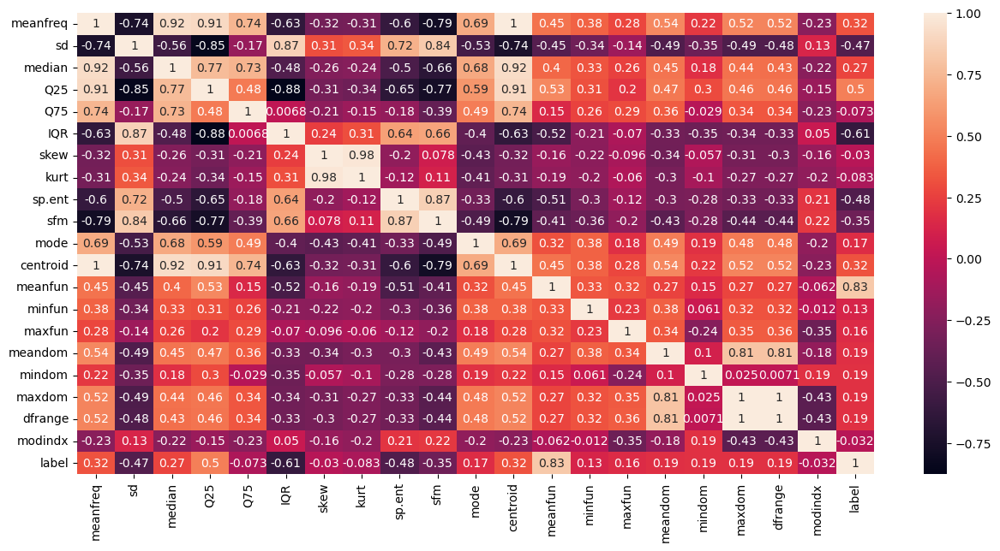

In [21]:
paper = plt.figure(figsize=(15,7))
sns.heatmap(data.corr(),annot=True)

**Observations**
- We can see few features have are higly positive and negatively co-related with each others.


In [37]:
#Lets do some EDA

**Question**: What is the Distribution of Spectral Flatness(sfm) of the voice sample ?

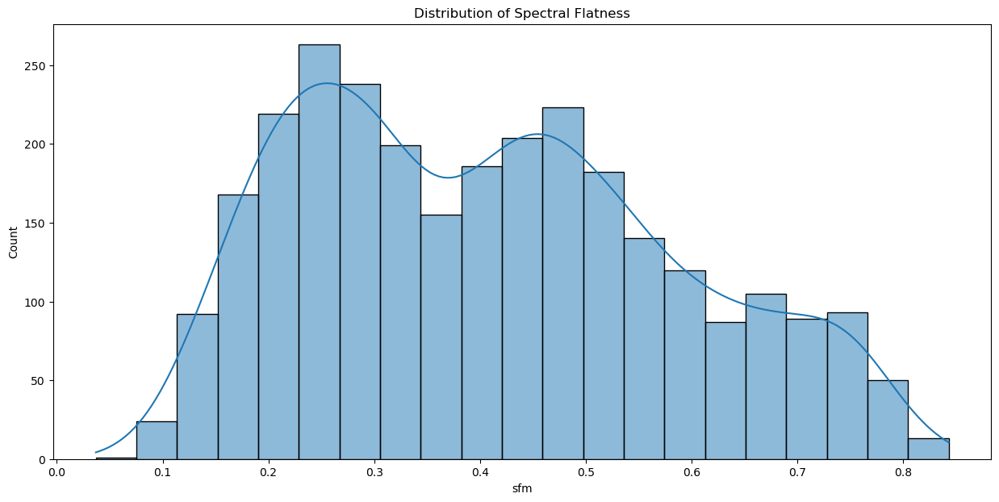

In [15]:
plt.figure(figsize=(15,7))
sns.histplot(data['sfm'],kde=True)
plt.title("Distribution of Spectral Flatness")
plt.show()

**Question**:What is the distribution of "Average of fundamental frequency measured across the acoustic signal"(meanfun)

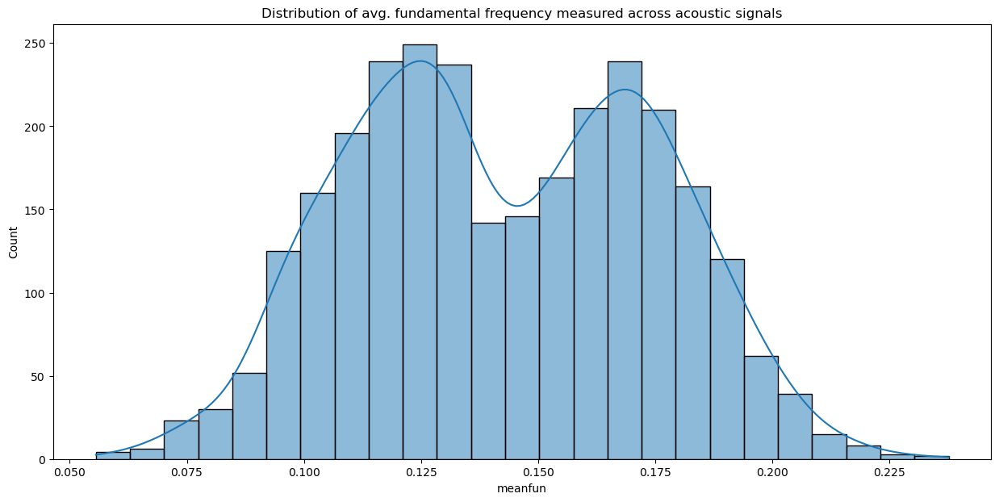

In [16]:
plt.figure(figsize=(15,7))
sns.histplot(data.meanfun,kde=True)
plt.title("Distribution of avg. fundamental frequency measured across acoustic signals")
plt.show()

**Question**: How is Male/Female distributed in our Dataset?

In [17]:
data['label'].value_counts()

female    1432
male      1419
Name: label, dtype: int64

In [18]:
#Lets plot a pie Chart

<AxesSubplot:ylabel='label'>

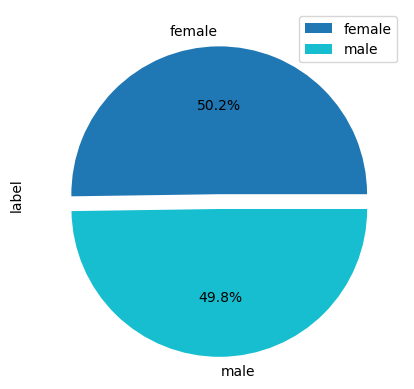

In [39]:
data['label'].value_counts().plot.pie(autopct='%3.1f%%',legend=True,explode=[0,0.1],cmap='tab10')

**Question**: Do we have any feature with very high skewness ?

In [46]:
data.skew()

meanfreq   -0.608137
sd          0.145654
median     -1.015778
Q25        -0.495925
Q75        -0.821695
IQR         0.299418
skew        4.946760
kurt        5.881449
sp.ent     -0.429966
sfm         0.350951
mode       -0.839555
centroid   -0.608137
meanfun     0.032909
minfun      1.916373
maxfun     -2.215242
meandom     0.610751
mindom      1.683842
maxdom      0.738665
dfrange     0.740749
modindx     2.075593
dtype: float64

**Observations**:
- We can see each feature has few outliers
- skew and kurt have high skewness.
- Lets see

In [63]:
def plot(col):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5), gridspec_kw={'wspace': 0.4, 'hspace': 0.4})  
    sns.boxplot(data=data, x=col, ax=axes[0])
    sns.distplot(a=data[col], ax=axes[1], color='#ff4125')
    plt.show()

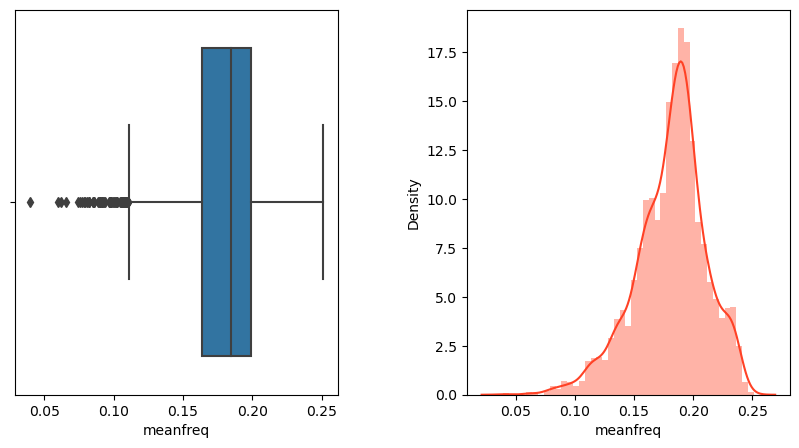

In [64]:
plot('meanfreq')

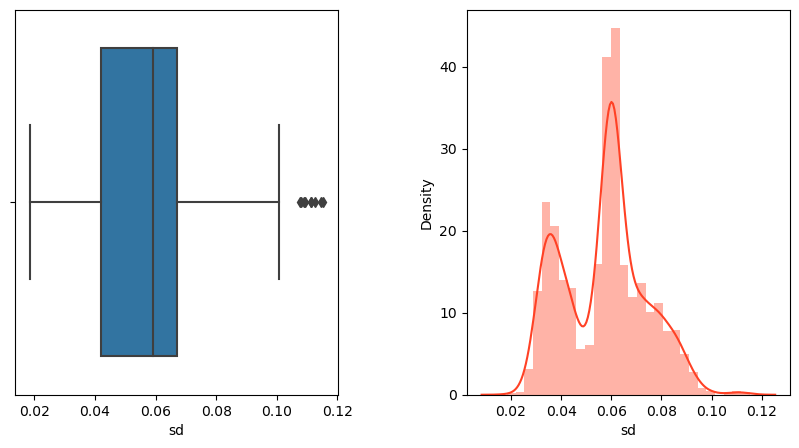

In [66]:
plot('sd')

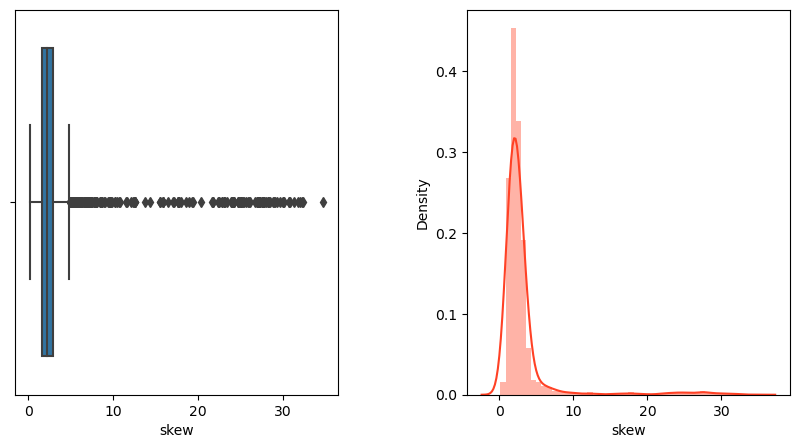

In [67]:
plot('skew')

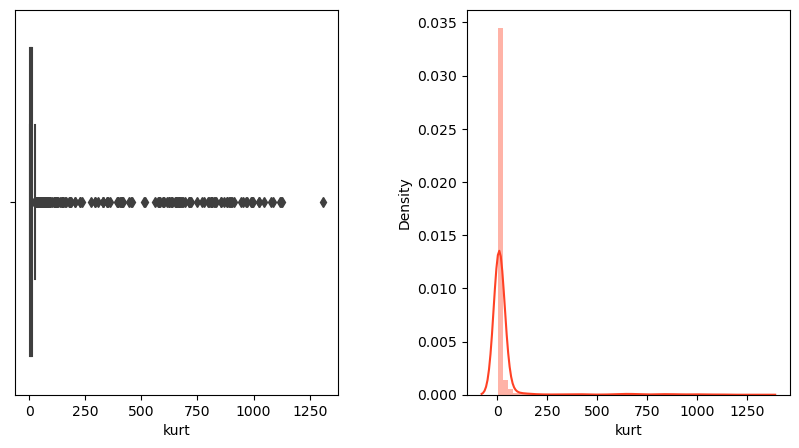

In [68]:
plot('kurt')

In [69]:
#Similarly,we can see for each feature

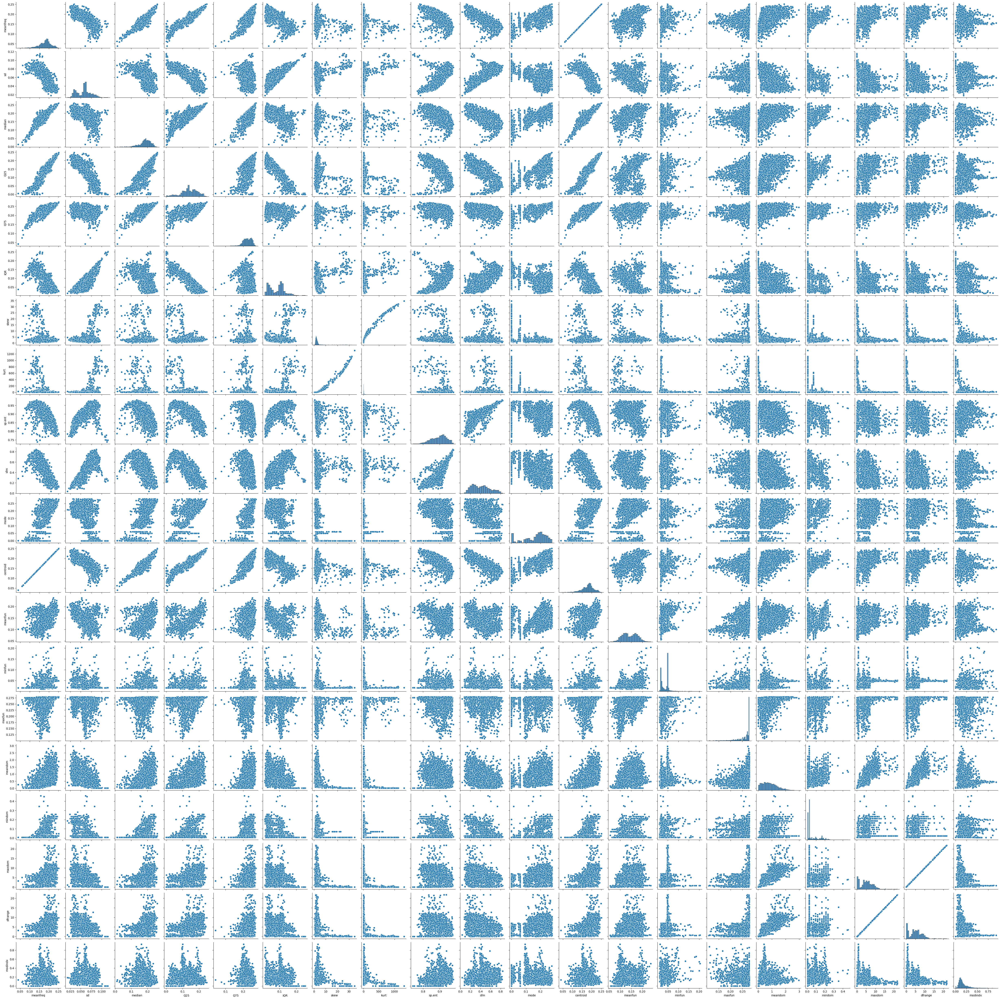

In [72]:
#sns.pairplot(data)

In [73]:
# Lets do some bi-variate analysis w.r.t our output feature'label'

In [74]:
#Lets define a function

In [87]:
def visualize_feature_distribution(feature_name):
    sns.set(style="whitegrid")
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=data, x='label', y=feature_name)
    plt.title(f"Distribution of {feature_name} by Gender")
    plt.xlabel('Gender')
    plt.ylabel(feature_name)
    plt.show()

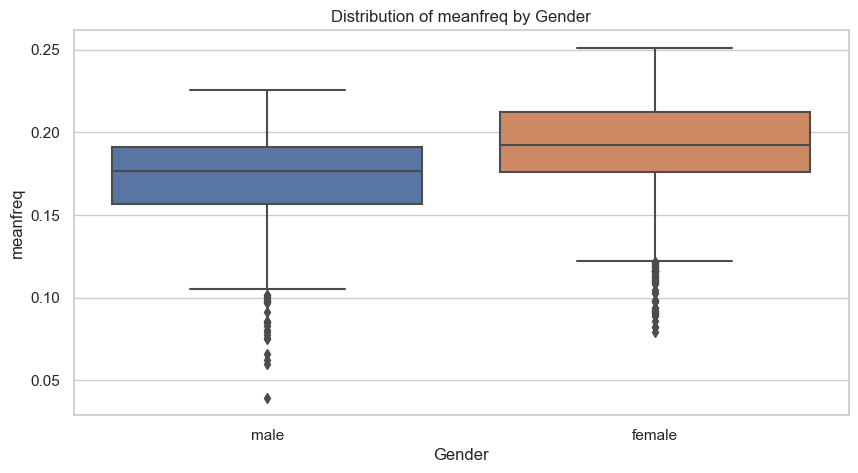

In [88]:
visualize_feature_distribution('meanfreq')

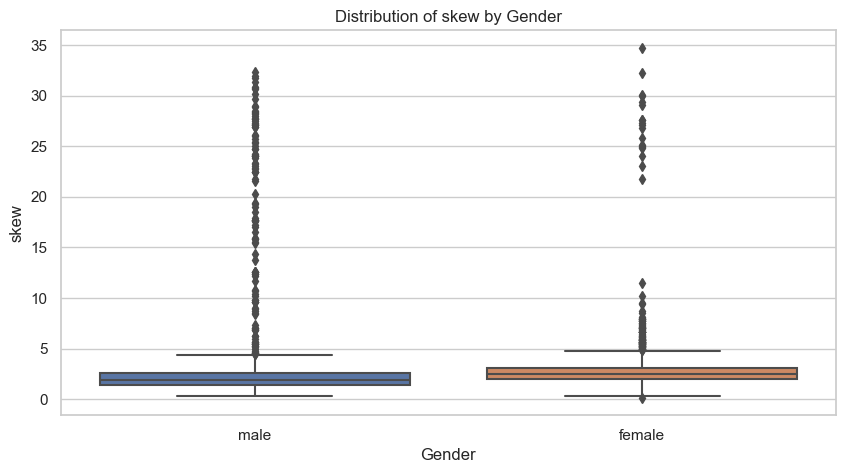

In [89]:
visualize_feature_distribution('skew')

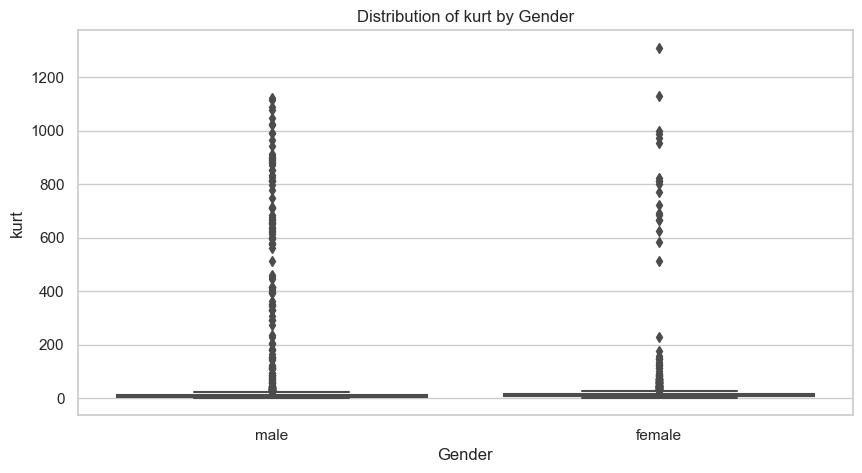

In [90]:
visualize_feature_distribution('kurt')

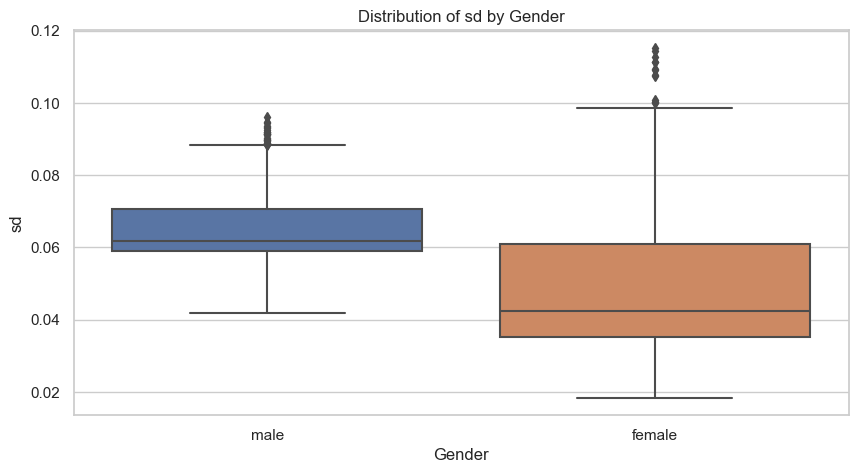

In [91]:
visualize_feature_distribution('sd')

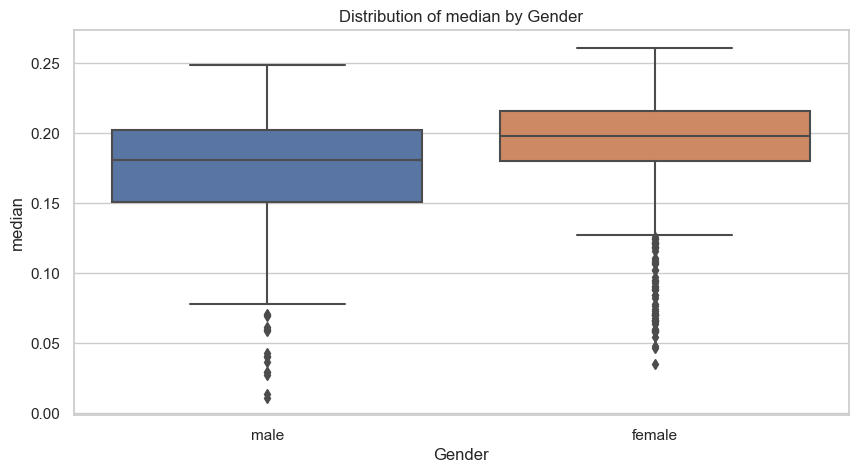

In [92]:
visualize_feature_distribution('median')

In [93]:
#We have seen how our Output feature is distributed among different features

<a name = Section7></a>

---
# **7. Data Preparation**
---


In [94]:
data.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,0.426868,0.195134,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,male
1,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,0.459881,0.171014,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,female
2,0.165290,0.061891,0.135071,0.118468,0.225176,0.106708,2.631865,12.629116,0.918897,0.413620,0.129191,0.165290,0.120050,0.035088,0.222222,0.458577,0.087891,1.015625,0.927734,0.459834,male
3,0.188100,0.055735,0.206028,0.130493,0.229470,0.098977,1.538406,5.145753,0.914325,0.398674,0.222698,0.188100,0.108470,0.021305,0.145455,0.493229,0.125000,4.734375,4.609375,0.105202,male
4,0.187497,0.044226,0.190071,0.156800,0.215435,0.058635,1.653083,5.839465,0.907477,0.337921,0.196000,0.187497,0.154529,0.048338,0.279070,1.113502,0.023438,8.765625,8.742188,0.103095,female


In [95]:
# We have out Output variable as Categorical type 

In [ ]:
#Lets replace Females with 1 and Males with 0

In [96]:
data["label"] = data["label"].replace({"female": 1, "male": 0})

In [97]:
data.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.162337,0.058206,0.174065,0.100225,0.196512,0.096287,2.127226,7.815129,0.921533,0.426868,0.195134,0.162337,0.095852,0.016754,0.235294,0.406033,0.046875,3.484375,3.437500,0.155348,0
1,0.161653,0.057435,0.170138,0.157522,0.182929,0.025407,6.968850,60.968047,0.870409,0.459881,0.171014,0.161653,0.163486,0.015601,0.204082,0.595161,0.170898,3.979492,3.808594,0.209073,1
2,0.165290,0.061891,0.135071,0.118468,0.225176,0.106708,2.631865,12.629116,0.918897,0.413620,0.129191,0.165290,0.120050,0.035088,0.222222,0.458577,0.087891,1.015625,0.927734,0.459834,0
3,0.188100,0.055735,0.206028,0.130493,0.229470,0.098977,1.538406,5.145753,0.914325,0.398674,0.222698,0.188100,0.108470,0.021305,0.145455,0.493229,0.125000,4.734375,4.609375,0.105202,0
4,0.187497,0.044226,0.190071,0.156800,0.215435,0.058635,1.653083,5.839465,0.907477,0.337921,0.196000,0.187497,0.154529,0.048338,0.279070,1.113502,0.023438,8.765625,8.742188,0.103095,1


<a name = Section71></a>
### **7.1 Data Scaling**

- In this section, we will scale our features to ensure that it one feature doesn't have more impact than others in terms of weights.

In [98]:
#Before scaling lets devide our Data into X and y

In [106]:
X = data.drop('label',axis=1)
y = data['label'].values

In [108]:
print(X.shape)
print(y.shape)

(2851, 20)
(2851,)


In [109]:
#Lets use Standard Scaler to bring all the features on the same scale

In [111]:
from sklearn.preprocessing import StandardScaler

In [112]:
sc = StandardScaler()

In [120]:
scaled_data = sc.fit_transform(X)

In [121]:
data2 = pd.DataFrame(data=scaled_data, columns=X.columns)

In [122]:
data2.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,-0.623883,0.064103,-0.322299,-0.825262,-1.200534,0.278687,-0.238108,-0.213025,0.585461,0.104014,0.385583,-0.623883,-1.461487,-1.047004,-0.794390,-0.813695,-0.091453,-0.451378,-0.449873,-0.155605
1,-0.646844,0.017576,-0.430875,0.353223,-1.778436,-1.380490,0.924906,0.191463,-0.556019,0.290687,0.071948,-0.646844,0.639881,-1.107138,-1.841760,-0.453776,1.878085,-0.310942,-0.344585,0.294196
2,-0.524738,0.286272,-1.400411,-0.450036,0.018980,0.522622,-0.116888,-0.176391,0.526612,0.029103,-0.471882,-0.524738,-0.709662,-0.091068,-1.233032,-0.713700,0.559890,-1.151617,-1.161949,2.393624
3,0.240925,-0.084888,0.561433,-0.202709,0.201657,0.341651,-0.379550,-0.233339,0.424534,-0.055412,0.744003,0.240925,-1.069463,-0.809712,-3.809057,-0.647757,1.149201,-0.096827,-0.117386,-0.575439
4,0.220689,-0.778880,0.120239,0.338375,-0.395440,-0.602670,-0.352003,-0.228060,0.271625,-0.398937,0.396848,0.220689,0.361579,0.599828,0.674551,0.532652,-0.463650,1.046601,1.055184,-0.593074


<a name = Section8></a>

---
# **8. Model Development & Evaluation**
---

- In this section we will **develop different model**

- Then we will **analyze the results** obtained and **make our observations**.

- For **evaluation purpose** we will **focus** on **Precision**, **Recall**,**f1 scores**and **Accuracy** scores.

In [123]:
#Lets split our dependent and independent variables into training and testing dataset for further development.

In [125]:
X_train, X_test, y_train, y_test = train_test_split(data2, y, test_size=0.20, random_state=42)

In [126]:
# Display the shape of training and testing data
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

X_train shape:  (2280, 20)
y_train shape:  (2280,)
X_test shape:  (571, 20)
y_test shape:  (571,)


In [127]:
#Lets define a function for evaluation purpose

In [128]:
def model_eval(actual, predicted):
  acc_score = accuracy_score(actual, predicted)
  conf_matrix = confusion_matrix(actual, predicted)
  clas_rep = classification_report(actual, predicted)
  print('Model Accuracy is: ', round(acc_score, 2))
  print(conf_matrix)
  print(clas_rep)

<a name = Section81></a>
### **8.1 Logistic Regrerssion**

In [131]:
from sklearn.linear_model import LogisticRegression

In [132]:
lr = LogisticRegression()

In [134]:
lr.fit(X_train,y_train)

LogisticRegression()

In [135]:
preds_lr_train = lr.predict(X_train)
preds_lr_test = lr.predict(X_test)

In [138]:
model_eval(y_train,preds_lr_train)

Model Accuracy is:  0.97
[[1117   25]
 [  34 1104]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1142
           1       0.98      0.97      0.97      1138

    accuracy                           0.97      2280
   macro avg       0.97      0.97      0.97      2280
weighted avg       0.97      0.97      0.97      2280



In [139]:
model_eval(y_test,preds_lr_test)

Model Accuracy is:  0.97
[[273   4]
 [ 13 281]]
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       277
           1       0.99      0.96      0.97       294

    accuracy                           0.97       571
   macro avg       0.97      0.97      0.97       571
weighted avg       0.97      0.97      0.97       571



<a name = Section82></a>
### **8.2 Decision Tree**

In [141]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [143]:
preds_dtree_train = dtree.predict(X_train)
preds_dtree_test = dtree.predict(X_test)

In [144]:
model_eval(y_train,preds_dtree_train)

Model Accuracy is:  1.0
[[1142    0]
 [   0 1138]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1142
           1       1.00      1.00      1.00      1138

    accuracy                           1.00      2280
   macro avg       1.00      1.00      1.00      2280
weighted avg       1.00      1.00      1.00      2280



In [145]:
model_eval(y_test,preds_dtree_test)

Model Accuracy is:  0.96
[[268   9]
 [ 14 280]]
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       277
           1       0.97      0.95      0.96       294

    accuracy                           0.96       571
   macro avg       0.96      0.96      0.96       571
weighted avg       0.96      0.96      0.96       571



<a name = Section82></a>
### **8.3 Random Forest**

In [147]:
from sklearn.ensemble import RandomForestClassifier

In [148]:
rf = RandomForestClassifier(verbose=2,random_state=123)

In [149]:
rf.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
b

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished


RandomForestClassifier(random_state=123, verbose=2)

In [151]:
preds_rf_train = rf.predict(X_train)
preds_rf_test = rf.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


In [152]:
model_eval(y_train,preds_rf_train)

Model Accuracy is:  1.0
[[1142    0]
 [   0 1138]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1142
           1       1.00      1.00      1.00      1138

    accuracy                           1.00      2280
   macro avg       1.00      1.00      1.00      2280
weighted avg       1.00      1.00      1.00      2280



In [153]:
model_eval(y_test,preds_rf_test)

Model Accuracy is:  0.98
[[271   6]
 [  8 286]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       277
           1       0.98      0.97      0.98       294

    accuracy                           0.98       571
   macro avg       0.98      0.98      0.98       571
weighted avg       0.98      0.98      0.98       571



**Observations**
- DecisionTree and RandomForest is overfitting. 
- Lets do some hyperparameter tuning and see if our accuracy and f1 scores improves

In [269]:
rf2 = RandomForestClassifier(random_state=42)

In [270]:
rf2.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [271]:
preds_rf2_train = rf.predict(X_train)
preds_rf2_test = rf.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


In [272]:
model_eval(y_train,preds_rf2_train)

Model Accuracy is:  1.0
[[1142    0]
 [   0 1138]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1142
           1       1.00      1.00      1.00      1138

    accuracy                           1.00      2280
   macro avg       1.00      1.00      1.00      2280
weighted avg       1.00      1.00      1.00      2280



In [273]:
model_eval(y_test,preds_rf2_test)

Model Accuracy is:  0.98
[[271   6]
 [  8 286]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       277
           1       0.98      0.97      0.98       294

    accuracy                           0.98       571
   macro avg       0.98      0.98      0.98       571
weighted avg       0.98      0.98      0.98       571



**Observations**-
- We can see how the 3 models are performing.
- Decision Tree and Random Forest are overfitting maybe because of the outliers in our Dataset.
- Based on the bias Variance trade off we can consider RandomForest for this problem.

<a name = Section9></a>

---
# **9. Model Deployment on Real Test Dataset**
---

In [289]:
#Lets see our test dataset

In [308]:
# Load the data
test = pd.read_csv(filepath_or_buffer=('https://raw.githubusercontent.com/AnmolArora15/Gender-Recognition-by-Voice/main/voice_test.csv'))

# Get the dimesions of data
print('Shape of the test dataset:', test.shape)

# Output first 5 data rows
test.head()

Shape of the test dataset: (317, 21)


,Id,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,2148,0.186833,0.027472,0.184325,0.173955,0.204731,0.030777,2.655225,10.565846,0.821812,0.159883,0.180645,0.186833,0.172790,0.023495,0.271186,0.178571,0.007812,0.226562,0.218750,0.108929
1,1124,0.188879,0.060316,0.195537,0.138072,0.242975,0.104904,1.497393,5.037085,0.909425,0.374225,0.140386,0.188879,0.133092,0.050847,0.272727,0.855938,0.023438,8.718750,8.695312,0.098712
2,170,0.150705,0.087127,0.174299,0.069666,0.226082,0.156416,2.603951,22.328899,0.969287,0.781729,0.050181,0.150705,0.109992,0.017260,0.266667,1.240954,0.007812,5.562500,5.554688,0.332396
3,3158,0.183667,0.040607,0.182534,0.156480,0.207646,0.051166,2.054138,7.483019,0.898138,0.313925,0.177040,0.183667,0.149237,0.018648,0.262295,0.550312,0.007812,3.421875,3.414062,0.166503
4,2229,0.205159,0.039543,0.210805,0.186667,0.228908,0.042241,2.099683,7.562209,0.876002,0.271880,0.224885,0.205159,0.154736,0.047105,0.277457,1.578835,0.187500,10.804688,10.617188,0.113644


In [309]:
ref_number = test['Id']

In [310]:
new_test_df = test.drop('Id',axis=1)

In [311]:
new_test_df2 = sc.fit_transform(new_test_df)

In [312]:
new_test_df_final = pd.DataFrame(data=new_test_df2, columns=new_test_df.columns)

In [313]:
new_test_df_final.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,0.195964,-1.713118,-0.010184,0.662174,-0.821160,-1.222118,-0.139573,-0.201615,-1.538594,-1.343188,0.215207,0.195964,0.923221,-0.665606,0.415887,-1.174534,-0.680214,-1.317375,-1.305207,-0.529372
1,0.261996,0.194260,0.285078,-0.068116,0.722132,0.490877,-0.377191,-0.235558,0.342654,-0.172969,-0.289937,0.261996,-0.269020,0.733288,0.463454,0.127373,-0.443781,1.133486,1.142655,-0.614964
2,-0.969866,1.751327,-0.274198,-1.460299,0.040426,1.681265,-0.150095,-0.129395,1.628035,2.051839,-1.421750,-0.969866,-0.962781,-0.984477,0.276355,0.867380,-0.680214,0.222587,0.235706,1.342824
3,0.093822,-0.950304,-0.057357,0.306528,-0.703546,-0.750942,-0.262932,-0.220541,0.100310,-0.502184,0.169977,0.093822,0.215866,-0.913488,0.141398,-0.460042,-0.680214,-0.395202,-0.382464,-0.047014
4,0.787370,-1.012081,0.687128,0.920890,0.154469,-0.957179,-0.253585,-0.220055,-0.375008,-0.731730,0.770293,0.787370,0.381004,0.541888,0.609457,1.516793,2.038769,1.735492,1.697654,-0.489866


In [314]:
predictions_rf = rf2.predict(new_test_df)

In [315]:
submission_df = pd.DataFrame({'Id': ref_number, 'label': predictions_rf})

In [303]:
print(submission_df.shape)
submission_df.head()

(317, 2)


,Id,label
0,2148,1
1,1124,1
2,170,1
3,3158,1
4,2229,1


In [316]:
submission_df.to_csv('gender_recognition_by_voice.csv', index=False, header=False)